## Ans(5):

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from folium.plugins import HeatMap
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd
import random
import folium

In [23]:
pip install folium

     ------------------------------------ 102.3/102.3 kB 836.7 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


#### Step 1: Data Exploration

In [2]:
# Load the dataset
data = pd.read_csv('rideshare_kaggle.csv')

# Explore the dataset
data.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

#### Data Cleaning

In [3]:
data.isnull().sum().sum()

55095

In [4]:
data.dropna(axis=0,inplace=True)

In [5]:
data.isnull().sum().sum()

0

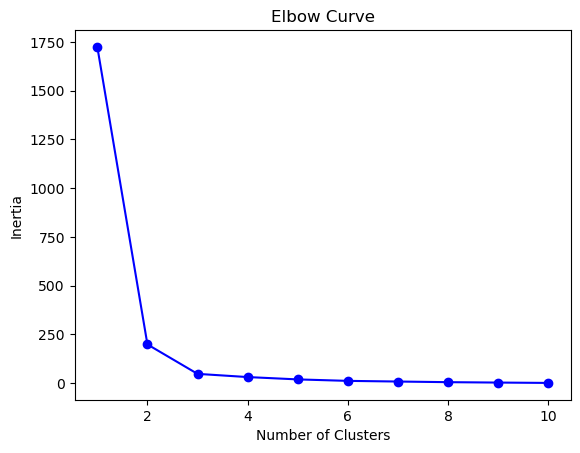

In [6]:
# Select relevant features for clustering
X = data[['latitude', 'longitude']]

# Determine the optimal number of clusters using the elbow method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.plot(range(1, 11), inertia, 'bo-')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Curve')
plt.show()

#### Step 2: Unsupervised Algorithm for Predicting High Booking Areas
For the unsupervised learning task, we will use K-means clustering algorithm.

In [7]:
# Perform K-means clustering
k = 5  # Choose the optimal value of k
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X)

KMeans(n_clusters=5, random_state=42)

In [9]:
# Add cluster labels to the dataset
data['Cluster'] = kmeans.labels_
# Create a map centered at the mean latitude and longitude
map_center = [data['latitude'].mean(), data['longitude'].mean()]
map_clusters = folium.Map(location=map_center, zoom_start=12)

In [10]:
# Create a map centered at the mean latitude and longitude
map_center = [data['latitude'].mean(), data['longitude'].mean()]
map_clusters = folium.Map(location=map_center, zoom_start=12)

# Randomly sample a subset of the data points
sampled_data = data.sample(n=500)  # Adjust the number of samples as per your preference

# Function to add markers with cluster colors in batches
def add_markers_batch(df):
    for _, row in df.iterrows():
        cluster_color = 'red' if row['Cluster'] == 0 else 'blue' if row['Cluster'] == 1 else 'green' if row['Cluster'] == 2 else 'yellow' if row['Cluster'] == 3 else 'purple'
        folium.Marker([row['latitude'], row['longitude']], icon=folium.Icon(color=cluster_color)).add_to(map_clusters)

# Split the sampled data into smaller batches and add markers in each batch
batch_size = 100  # Adjust the batch size as per your preference
batch_indices = [sampled_data.index[i:i+batch_size] for i in range(0, len(sampled_data), batch_size)]
for indices in batch_indices:
    batch_data = sampled_data.loc[indices]
    add_markers_batch(batch_data)

# Display the map
map_clusters


C:\Users\sudhir\AppData\Local\Temp\ipykernel_17924\2400376229.py:15: UserWarning: color argument of Icon should be one of: {'cadetblue', 'orange', 'gray', 'darkblue', 'beige', 'red', 'lightgray', 'blue', 'lightred', 'lightblue', 'purple', 'white', 'black', 'darkgreen', 'pink', 'green', 'lightgreen', 'darkpurple', 'darkred'}.
  folium.Marker([row['latitude'], row['longitude']], icon=folium.Icon(color=cluster_color)).add_to(map_clusters)


### Step 3: Supervised Algorithm for Estimating Prices
For the supervised learning task, we will use linear regression as an example.

In [11]:
# Select features and target variable
X = data[['latitude', 'longitude']]
y = data['price']
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict prices for the test set
y_pred = model.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print('Mean Squared Error:', mse)
print('Mean Absolute Error:', mae)

Mean Squared Error: 87.18083714909837
Mean Absolute Error: 7.560030331228578


In [12]:
# Create a map centered at the mean latitude and longitude
map_center = [data['latitude'].mean(), data['longitude'].mean()]
map_prices = folium.Map(location=map_center, zoom_start=12)

# Create a HeatMap layer for prices
heat_data = data[['latitude', 'longitude', 'price']].values.tolist()
HeatMap(heat_data).add_to(map_prices)

# Display the map
map_prices